In [1]:
import pandas as pd, numpy as np
from sklearn.linear_model import LogisticRegression

from sklearn.ensemble import RandomForestClassifier

from sklearn import tree
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from nltk.corpus import stopwords
from sklearn.multiclass import OneVsRestClassifier
import re, string
from sklearn.model_selection import train_test_split # Not for Kaggle
import jieba.posseg as pseg
from gensim.models import Word2Vec
from nltk.corpus.reader import wordlist
from sentence_transformers import SentenceTransformer


In [2]:
# 随机抽取 抽过一次做测试的时候就不用再抽了
# data = pd.read_csv('./resFin.csv')

# train, test = train_test_split(data) # shuffle=False resulted in "Invalid parameters passed". Why?
# train.to_csv("./train_samples.csv",index=False,encoding='utf_8_sig')
# test.to_csv("./test_samples.csv",index=False,encoding='utf_8_sig')
model = SentenceTransformer('distiluse-base-multilingual-cased-v1')

In [3]:
# 读取数据
train = pd.read_csv('./train_samples.csv')
test = pd.read_csv('./test_samples.csv')



In [4]:
train.head()

,id,name,text,中文名,外文名,别名,拼音,国籍,本名,作者,类型,书名,作品名称
0,6625,工业文明,工业文明，是指工业社会文明亦即未来学家托夫勒所言的第二次浪潮文明，它贯穿着劳动方式最优化、劳...,1,0,0,0,0,0,0,0,0,0
1,8106,敫桂英,敫桂英是京剧折子戏《打神告庙》中的人物，敫桂英曾救助落难书生王魁，两人在海神庙山盟海誓，王魁...,0,0,0,0,0,1,0,0,0,0
2,5118,上海中晨数字技术设备有限公司,上海中晨数字技术设备有限公司于2000年10月24日在普陀区市场监督管理局登记成立。法定代表...,0,0,0,0,0,0,0,0,0,0
3,6008,洛威·舍曼,洛威·舍曼，影视演员、导演，主要作品有《希腊人对此有说法》等。 洛威·舍曼主要作品 编辑 语...,1,0,0,0,0,0,0,0,0,0
4,1453,肪,【汉字】肪，【拼音】fáng [1] 肪详细释义 编辑 语音 〈名〉形声。字从肉从方，方亦声...,1,0,0,1,0,0,0,0,0,0


In [5]:
# train['text'][0]

In [6]:
# train['text'][2]

In [7]:
lens = train.text.str.len()
lens.mean(), lens.std(), lens.max()

(2103.5833143378163, 2290.2006701394544, 18918.0)

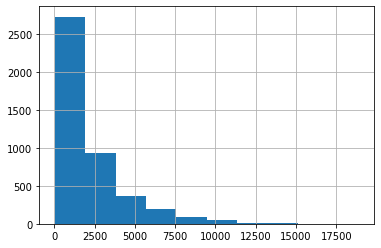

In [8]:
lens.hist();

In [9]:

label_cols = ['中文名',	'外文名',	'别名',	'拼音',	'国籍',	'本名',	'作者',	'类型',	'书名',	'作品名称']
train['none'] = 1-train[label_cols].max(axis=1)
train.describe()

,id,中文名,外文名,别名,拼音,国籍,本名,作者,类型,书名,作品名称,none
count,4421.000000,4421.000000,4421.000000,4421.000000,4421.000000,4421.000000,4421.000000,4421.000000,4421.000000,4421.000000,4421.000000,4421.000000
mean,4078.889392,0.905225,0.517078,0.053834,0.045012,0.034155,0.028274,0.023298,0.018322,0.016060,0.009952,0.018774
std,2337.151546,0.292937,0.499765,0.225715,0.207355,0.181648,0.165774,0.150865,0.134127,0.125719,0.099276,0.135741
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2063.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4092.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,6096.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,8180.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [10]:
len(train),len(test)

(4421, 1474)

In [11]:
COMMENT = 'text'
train[COMMENT].fillna("unknown", inplace=True)
test[COMMENT].fillna("unknown", inplace=True)

In [12]:
def clean_text(text):
    text = text.lower()
    text = re.sub(r"what's", "what is ", text)
    text = re.sub(r"\'s", " ", text)
    text = re.sub(r"\'ve", " have ", text)
    text = re.sub(r"can't", "can not ", text)
    text = re.sub(r"n't", " not ", text)
    text = re.sub(r"i'm", "i am ", text)
    text = re.sub(r"\'re", " are ", text)
    text = re.sub(r"\'d", " would ", text)
    text = re.sub(r"\'ll", " will ", text)
    text = re.sub(r"\'scuse", " excuse ", text)
    text = re.sub('\W', ' ', text)
    text = re.sub('\s+', ' ', text)
    text = text.strip(' ')
    text = text.replace(" ", "")
    return text

In [13]:
test['text'] = test['text'].map(lambda com : clean_text(com))

In [14]:

# sentence_embeddings = model.encode(sentence)

# for sentence, embedding in zip(sentence, sentence_embeddings):
#     print("Sentence:", sentence)
#     print("Embedding:", embedding)
#     print("")

In [15]:
# 不分句，整篇文章转512维度的向量，做分类
# 分句子，把句子向量都拼在一起再分类
trainWordList = []
testWordList = []
for item in train[COMMENT]:
    # print(item)
    sentence_embeddings = model.encode(item)
    trainWordList.append(sentence_embeddings)
for item in test[COMMENT]:
    # print(item)
    sentence_embeddings = model.encode(item)
    # print()
    testWordList.append(sentence_embeddings)

In [18]:
# tdidf版本 2vec
# n = train.shape[0]
# # TfidfVectorizer 完成向量化与 TF-IDF 预处理

# vec = TfidfVectorizer(ngram_range=(1,2), tokenizer=tokenize,
#                min_df=3, max_df=0.9, strip_accents='unicode', use_idf=1,encoding='utf-8',
#                smooth_idf=1, sublinear_tf=1 )

# print(trainWordList)
# testWordList
# trn_term_doc = vec.fit_transform(trainWordList)
# test_term_doc = vec.transform(testWordList)
trainWordList

[array([ 2.11315360e-02, -5.58548868e-02, -3.31113189e-02,  5.70184970e-03,
         5.65238073e-02,  7.13175675e-03,  3.45369279e-02,  3.49844955e-02,
        -9.19003040e-03,  3.41584496e-02, -4.91457582e-02,  6.14228435e-02,
         1.56731177e-02, -8.93019289e-02, -1.04153121e-03, -2.66054850e-02,
         4.32029143e-02, -4.60733436e-02, -2.53748111e-02, -2.30995920e-02,
         2.82901954e-02, -1.40959686e-02,  1.53068649e-02,  4.23830263e-02,
         2.60472558e-02, -2.78445799e-02, -1.11912526e-02, -1.66689362e-02,
        -2.37600226e-02,  5.90834878e-02,  2.73701698e-02, -1.84278470e-04,
         3.29331607e-02, -7.00663626e-02, -1.30315740e-02,  4.04023156e-02,
        -7.14014769e-02,  3.49119380e-02, -2.21629441e-02, -2.43469141e-03,
        -6.83576241e-02, -2.63408609e-02,  4.47953045e-02,  7.75551284e-03,
         4.81312396e-03, -2.57767029e-02, -6.40951423e-03,  3.24385948e-02,
        -1.29282288e-02, -3.09198294e-02,  2.27363221e-02,  4.19472195e-02,
         3.4

In [ ]:
# # 生成语料词典
# dictionary = corpora.Dictionary(words_ls)
# # print(dictionary)

# # Initialise model, for more information, please check the Gensim Word2vec documentation
# model = Word2Vec(sentences=trainWordList,  window=2, min_count=0)
# # Get a list of words in the vocabulary
# # words = model.wv.vocab.keys()
# # Make a dictionary
# trainWordList.apply(model.vectorize)
# print(trainWordList.apply(model.vectorize))
# print(trainWordList)

# trn_term_doc = [ model.wv['我'] for sentence in trainWordList]
# test_term_doc = [ model[sentence] for sentence in testWordList]
# print(we_dict)
# # 生成稀疏向量集
# corpus = [dictionary.doc2bow(words) for words in words_ls]
# corpus
# we_dict
# trn_term_doc

In [ ]:
# def pr(y_i, y):
#     p = x[y==y_i].sum(0)
#     return (p+1) / ((y==y_i).sum()+1)

In [19]:
x = trainWordList
test_x = testWordList

In [20]:
# def get_mdl(y):
    # y = y.values
    # r = np.log(pr(1,y) / pr(0,y))
    # m = LogisticRegression(C=4, dual=False)
    # m = MultinomialNB()
    # x_nb = x.multiply(r)
    # return m.fit(x_nb, y), r
def get_mdl(x,y):
    m = LogisticRegression()
    return m.fit(x, y)

In [21]:
preds = np.zeros((len(test), len(label_cols)))
# print(label_cols)
for i, j in enumerate(label_cols):
    print('fit', j)
    m = get_mdl(x,train[j])
    preds[:,i] = m.predict_proba(test_x)[:,1]

fit 中文名
fit 外文名
fit 别名
fit 拼音
fit 国籍
fit 本名
fit 作者
fit 类型
fit 书名
fit 作品名称


In [ ]:
# len(test) as length, len(label_cols) as width init with zero
# simvsm_similiar = np.zeros((len(test), len(label_cols)))
# simvsm = SimVsm()
# print(simvsm_similiar.shape)
# for i, j in enumerate(label_cols):
#     simvsm_similiar[:,i] = simvsm.arr_distance(test[COMMENT], j)

In [ ]:
submission = pd.DataFrame(preds, columns = label_cols)
submission.to_csv('submission_bert_logistic.csv', index=False)